In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import dendrogram, ward, single
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.datasets import make_blobs
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN
from matplotlib.colors import ListedColormap
warnings.filterwarnings("ignore")

## **1 - About Dataset**

This case requires to develop a customer segmentation to define marketing strategy.

The sample Dataset summarizes the usage behavior of about 9000 active credit card holders during the last 6 months.

The file is at a customer level with 18 behavioral variables.

Following is the Data Dictionary for Credit Card dataset :-

- CUST_ID : Identification of Credit Card holder (Categorical)
- BALANCE : Balance amount left in their account to make purchases
- BALANCE_FREQUENCY : How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)
- PURCHASES : Amount of purchases made from account
- ONEOFF_PURCHASES : Maximum purchase amount done in one-go
- INSTALLMENTS_PURCHASES : Amount of purchase done in installment
- CASH_ADVANCE : Cash in advance given by the user
- PURCHASES_FREQUENCY : How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)
- ONEOFFPURCHASESFREQUENCY : How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)
- PURCHASESINSTALLMENTSFREQUENCY : How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)
- CASHADVANCEFREQUENCY : How frequently the cash in advance being paid
- CASHADVANCETRX : Number of Transactions made with "Cash in Advanced"
- PURCHASES_TRX : Numbe of purchase transactions made
- CREDIT_LIMIT : Limit of Credit Card for user
- PAYMENTS : Amount of Payment done by user
- MINIMUM_PAYMENTS : Minimum amount of payments made by user
- PRCFULLPAYMENT : Percent of full payment paid by user
- TENURE : Tenure of credit card service for user

In [ ]:
!ls

 clusters_DBSCAN.pdf   clusters_gmm.pdf  'Customer Data.csv'   drive   sample_data   test.pdf


In [ ]:
#read the data

data_path = '/content/Customer Data.csv'  #the path where you downloaded the data
df = pd.read_csv(data_path)

print('The shape of the dataset is:', df.shape)

The shape of the dataset is: (8950, 18)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## **2 - Data investigation** 📊📉



In [ ]:
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [ ]:
# Let's see the data types and non-null values for each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [ ]:
df.duplicated().sum()

0

In [ ]:
# Percentage of Null-rows
round(df.isnull().sum(axis=0)*100/df.shape[0],2)

,0
CUST_ID,0.00
BALANCE,0.00
BALANCE_FREQUENCY,0.00
PURCHASES,0.00
ONEOFF_PURCHASES,0.00
INSTALLMENTS_PURCHASES,0.00
CASH_ADVANCE,0.00
PURCHASES_FREQUENCY,0.00
ONEOFF_PURCHASES_FREQUENCY,0.00
PURCHASES_INSTALLMENTS_FREQUENCY,0.00


## **AS NULL % is relatively small 3.5%  so I'll<font color='green'> DROP  </font>Null-containing Rows**

## **3 - Data cleaning**

In [ ]:
df.dropna(inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8636 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8636 non-null   object 
 1   BALANCE                           8636 non-null   float64
 2   BALANCE_FREQUENCY                 8636 non-null   float64
 3   PURCHASES                         8636 non-null   float64
 4   ONEOFF_PURCHASES                  8636 non-null   float64
 5   INSTALLMENTS_PURCHASES            8636 non-null   float64
 6   CASH_ADVANCE                      8636 non-null   float64
 7   PURCHASES_FREQUENCY               8636 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8636 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8636 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8636 non-null   float64
 11  CASH_ADVANCE_TRX                  8636 non-null   int64  
 12  PURCHASES_T

In [ ]:
# This will print basic statistics for numerical columns
df.describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,8636.0,1601.224893,2095.571300,0.000000,148.095189,916.855459,2105.195853,19043.13856
BALANCE_FREQUENCY,8636.0,0.895035,0.207697,0.000000,0.909091,1.000000,1.000000,1.00000
PURCHASES,8636.0,1025.433874,2167.107984,0.000000,43.367500,375.405000,1145.980000,49039.57000
ONEOFF_PURCHASES,8636.0,604.901438,1684.307803,0.000000,0.000000,44.995000,599.100000,40761.25000
INSTALLMENTS_PURCHASES,8636.0,420.843533,917.245182,0.000000,0.000000,94.785000,484.147500,22500.00000
CASH_ADVANCE,8636.0,994.175523,2121.458303,0.000000,0.000000,0.000000,1132.385490,47137.21176
PURCHASES_FREQUENCY,8636.0,0.496000,0.401273,0.000000,0.083333,0.500000,0.916667,1.00000
ONEOFF_PURCHASES_FREQUENCY,8636.0,0.205909,0.300054,0.000000,0.000000,0.083333,0.333333,1.00000
PURCHASES_INSTALLMENTS_FREQUENCY,8636.0,0.368820,0.398093,0.000000,0.000000,0.166667,0.750000,1.00000
CASH_ADVANCE_FREQUENCY,8636.0,0.137604,0.201791,0.000000,0.000000,0.000000,0.250000,1.50000


### **Something unlogical about column 'CASH_ADVANCE_FREQUENCY' it has MAX : 1.5  , although dataset describtion tells us it has max : 1**

#### **So, Let's invistigate what is the problem !**

In [ ]:
len(df[df['CASH_ADVANCE_FREQUENCY'] > 1])

8

## *Just 8 Rows, so there is no problems to drop them*

In [ ]:
df.drop(df[df['CASH_ADVANCE_FREQUENCY'] > 1].index, inplace=True)
df.shape

(8628, 18)

## **Drawing BOX_PLOT to *visualize outlier***

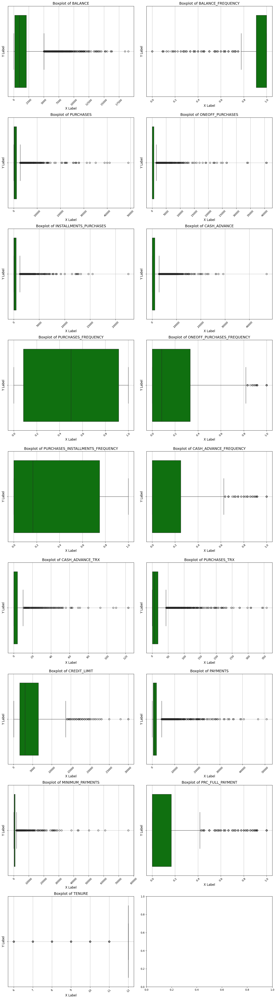

In [ ]:
# Get the list of columns in your DataFrame
columns = df.drop(columns='CUST_ID').columns

# Define the number of rows and columns for subplots based on the number of columns
num_rows = (len(columns) + 1) // 2  # Add 1 and then divide to ensure at least 1 row
num_cols = 2  # Two columns of subplots

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 6*num_rows))

# Flatten axes if necessary
if num_rows > 1:
    axes = axes.flatten()
else:
    axes = [axes]

# Iterate over each column and create a boxplot
for i, col in enumerate(columns):
    sns.boxplot(x=df[col], ax=axes[i], color='green')
    axes[i].set_title(f'Boxplot of {col}', fontsize=14)
    axes[i].set_xlabel('X Label', fontsize=12)
    axes[i].set_ylabel('Y Label', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)  # Rotate x-axis labels if needed
    axes[i].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()


## **Try .. JUST Trying to drop outliers**

In [ ]:
# Define a function to drop outliers based on a specified criteria
def drop_outliers(df, columns, threshold=1.5):
    """
    Drop outliers from specified columns in a DataFrame.

    Parameters:
        df (DataFrame): The DataFrame containing the data.
        columns (list): A list of column names to check for outliers.
        threshold (float): The threshold for identifying outliers.
                           Data points beyond threshold * IQR are considered outliers.
                           Default is 1.5.

    Returns:
        DataFrame: The DataFrame with outliers removed.
    """
    df_out = df.copy()
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - threshold * IQR
        upper_bound = Q3 + threshold * IQR
        df_out = df_out[(df_out[col] >= lower_bound) & (df_out[col] <= upper_bound)]
        print(f"Column {col} has number of outliers = {df[(df[col] < lower_bound) | (df[col] > upper_bound)].shape[0]}")
    return df_out

# List of columns for which you want to drop outliers
columns_to_check = df.drop(columns='CUST_ID').columns

# Drop outliers from specified columns
df_cleaned = drop_outliers(df, columns_to_check)

# Optionally, you can reset the index if you wish to reindex the DataFrame after dropping rows
df_cleaned.reset_index(drop=True, inplace=True)

print(df_cleaned.shape)

Column BALANCE has number of outliers = 667
Column BALANCE_FREQUENCY has number of outliers = 1511
Column PURCHASES has number of outliers = 767
Column ONEOFF_PURCHASES has number of outliers = 957
Column INSTALLMENTS_PURCHASES has number of outliers = 810
Column CASH_ADVANCE has number of outliers = 976
Column PURCHASES_FREQUENCY has number of outliers = 0
Column ONEOFF_PURCHASES_FREQUENCY has number of outliers = 749
Column PURCHASES_INSTALLMENTS_FREQUENCY has number of outliers = 0
Column CASH_ADVANCE_FREQUENCY has number of outliers = 333
Column CASH_ADVANCE_TRX has number of outliers = 787
Column PURCHASES_TRX has number of outliers = 716
Column CREDIT_LIMIT has number of outliers = 243
Column PAYMENTS has number of outliers = 784
Column MINIMUM_PAYMENTS has number of outliers = 841
Column PRC_FULL_PAYMENT has number of outliers = 1343
Column TENURE has number of outliers = 1282
(2953, 18)


In [ ]:
df_cleaned.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.0,0.166667,0.000000,0.083333,0.0,0,2,1000.0,201.802084,139.509787,0.0,12
1,C10005,817.714335,1.000000,16.00,16.00,0.0,0.0,0.083333,0.083333,0.000000,0.0,0,1,1200.0,678.334763,244.791237,0.0,12
2,C10008,1823.652743,1.000000,436.20,0.00,436.2,0.0,1.000000,0.000000,1.000000,0.0,0,12,2300.0,679.065082,532.033990,0.0,12
3,C10009,1014.926473,1.000000,861.49,661.49,200.0,0.0,0.333333,0.083333,0.250000,0.0,0,5,7000.0,688.278568,311.963409,0.0,12
4,C10012,630.794744,0.818182,1492.18,1492.18,0.0,0.0,0.250000,0.250000,0.000000,0.0,0,6,2000.0,705.618627,155.549069,0.0,12


## It is **NOT**  a practical way to drop 66% of data because it has outliers, so I'll investigate the ***distribution*** of data

## **4- Data understanding (EDA) :**

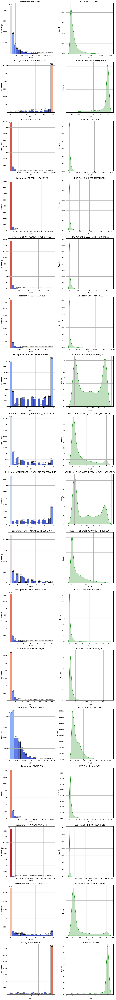

In [ ]:
import matplotlib.cm as cm

# List of columns for which you want to plot the distribution
columns_to_plot = df.drop(columns='CUST_ID').columns

# Set up the figure and axes for subplots
num_rows = len(columns_to_plot)
fig, axes = plt.subplots(num_rows, 2, figsize=(12, 6*num_rows))

# Flatten axes if necessary
if num_rows > 1:
    axes = axes.flatten()
else:
    axes = [axes]

# Define a colormap
color_map = cm.get_cmap('coolwarm')

# Plot histograms and KDE plots for each column
for i, col in enumerate(columns_to_plot):
    # Histogram
    total = len(df[col])
    sns.histplot(df[col], ax=axes[i*2], kde=False, color='blue', bins=20)
    axes[i*2].set_title(f'Histogram of {col}', fontsize=14)
    axes[i*2].set_xlabel('Value', fontsize=12)
    axes[i*2].set_ylabel('Percentage', fontsize=12)
    axes[i*2].grid(True)
    for j, rect in enumerate(axes[i*2].patches):
        height = rect.get_height()
        percentage = height/total
        color = color_map(percentage)
        rect.set_facecolor(color)
        axes[i*2].annotate(f'{percentage:.2%}', xy=(rect.get_x() + rect.get_width() / 2, height), xytext=(0, 3),
                           textcoords="offset points", ha='center', va='bottom', fontsize=6)  # Adjust font size here

    # KDE plot
    sns.kdeplot(df[col], ax=axes[i*2+1], color='green', shade=True)
    axes[i*2+1].set_title(f'KDE Plot of {col}', fontsize=14)
    axes[i*2+1].set_xlabel('Value', fontsize=12)
    axes[i*2+1].set_ylabel('Density', fontsize=12)
    axes[i*2+1].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()


# **Highly skewed data !!**

- Dealing with that later

### **What about correlation ?**

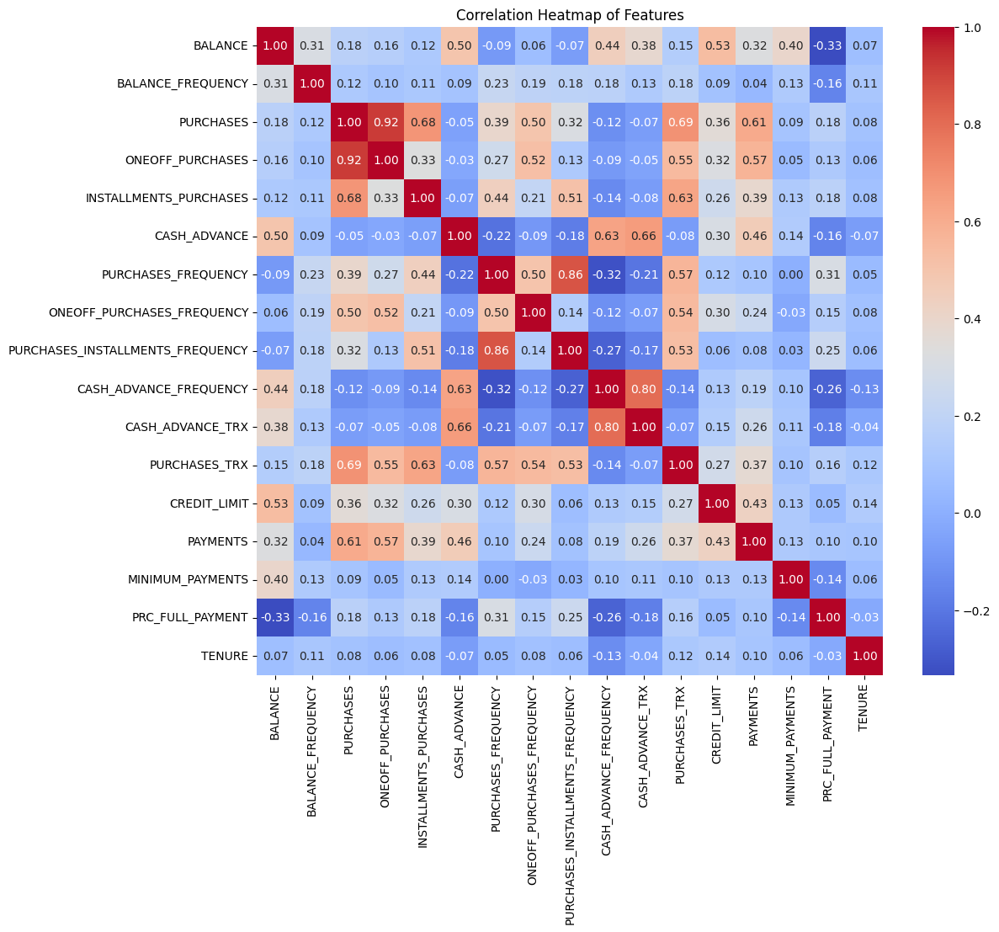

In [ ]:
# Compute the correlation matrix
correlation_matrix = np.corrcoef(df.drop(columns='CUST_ID'), rowvar=False)

# Get column names
column_names = df.drop(columns='CUST_ID').columns.tolist()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", xticklabels=column_names, yticklabels=column_names)
plt.title("Correlation Heatmap of Features")
plt.show()


## Correlation investigation:

- **High correlation by default :**

1- Purchases and (oneoff purchases, installment purchases, purchases frequency, oneoff purchases frequency, installments purchases frequency, purchases TRX) ***Increasing***

2- Oneoff purchases and (oneoff purchases frequency, purchases TRX) ***Increasing***

3- Installments purchases and (installments purchases frequency, purchases TRX) ***Increasing***

4- Chash advance and (cahs advance frequency, cash advance TRX) ***Increasing***


- **High correlation because of business nature :**

1- Balance and Cash advance and (frequency, TRX) ***Increasing***

2- Balance and credit limit ***Increasing***

2- Balance and min payments full payment ***Increasing***

3- Balance and prc% full payment ***Decreasing***

4- Payment and (purchases, oneoff purchases, installment purchases, credit limit, cash advance) ***Increasing***


### Because data is skewed, I'll take the **LOG SCALE** of open-Ranges data ⚒⛏🔧

In [ ]:
df.columns.to_list()

['CUST_ID',
 'BALANCE',
 'BALANCE_FREQUENCY',
 'PURCHASES',
 'ONEOFF_PURCHASES',
 'INSTALLMENTS_PURCHASES',
 'CASH_ADVANCE',
 'PURCHASES_FREQUENCY',
 'ONEOFF_PURCHASES_FREQUENCY',
 'PURCHASES_INSTALLMENTS_FREQUENCY',
 'CASH_ADVANCE_FREQUENCY',
 'CASH_ADVANCE_TRX',
 'PURCHASES_TRX',
 'CREDIT_LIMIT',
 'PAYMENTS',
 'MINIMUM_PAYMENTS',
 'PRC_FULL_PAYMENT',
 'TENURE']

In [ ]:
open_limits_features = ['BALANCE',
                          'PURCHASES',
                          'ONEOFF_PURCHASES',
                          'INSTALLMENTS_PURCHASES',
                          'CASH_ADVANCE',  'CREDIT_LIMIT',
                          'PAYMENTS',
                          'MINIMUM_PAYMENTS',
                          'CASH_ADVANCE_TRX',
                          'PURCHASES_TRX'
                          ]
bounded_limits_features = ['CUST_ID',
                      'BALANCE_FREQUENCY',
                      'PURCHASES_FREQUENCY',
                      'ONEOFF_PURCHASES_FREQUENCY',
                      'PURCHASES_INSTALLMENTS_FREQUENCY',
                      'CASH_ADVANCE_FREQUENCY',
                      'PRC_FULL_PAYMENT',
                      'TENURE' ]
log_scaled_data = np.log1p(df.drop(columns='CUST_ID')[open_limits_features])
log_scaled_data[bounded_limits_features] = df[bounded_limits_features]
log_scaled_data.head()

,BALANCE,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,CASH_ADVANCE_TRX,PURCHASES_TRX,CUST_ID,BALANCE_FREQUENCY,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PRC_FULL_PAYMENT,TENURE
0,3.735304,4.568506,0.000000,4.568506,0.000000,6.908755,5.312231,4.945277,0.000000,1.098612,C10001,0.818182,0.166667,0.000000,0.083333,0.00,0.000000,12
1,8.071989,0.000000,0.000000,0.000000,8.770896,8.853808,8.319725,6.978531,1.609438,0.000000,C10002,0.909091,0.000000,0.000000,0.000000,0.25,0.222222,12
2,7.822504,6.651791,6.651791,0.000000,0.000000,8.922792,6.434654,6.442994,0.000000,2.564949,C10003,1.000000,1.000000,1.000000,0.000000,0.00,0.000000,12
4,6.707735,2.833213,2.833213,0.000000,0.000000,7.090910,6.521114,5.504483,0.000000,0.693147,C10005,1.000000,0.083333,0.083333,0.000000,0.00,0.000000,12
5,7.501540,7.196147,0.000000,7.196147,0.000000,7.496097,7.244983,7.786654,0.000000,2.197225,C10006,1.000000,0.666667,0.000000,0.583333,0.00,0.000000,12


In [ ]:
log_scaled_data.describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,8628.0,6.263784,1.895731,0.000000,5.002047,6.821483,7.648600,9.854515
PURCHASES,8628.0,4.930346,2.922694,0.000000,3.801415,5.932563,7.045406,10.800403
ONEOFF_PURCHASES,8628.0,3.239374,3.253139,0.000000,0.000000,3.827445,6.398595,10.615512
INSTALLMENTS_PURCHASES,8628.0,3.391024,3.090719,0.000000,0.000000,4.568714,6.185905,10.021315
CASH_ADVANCE,8628.0,3.344739,3.569816,0.000000,0.000000,0.000000,7.029957,10.760839
CREDIT_LIMIT,8628.0,8.098985,0.822379,3.931826,7.378384,8.006701,8.779711,10.308986
PAYMENTS,8628.0,6.814966,1.160222,0.048326,6.038606,6.800485,7.576760,10.834125
MINIMUM_PAYMENTS,8628.0,5.921771,1.190236,0.018982,5.136164,5.745565,6.715681,11.243832
CASH_ADVANCE_TRX,8628.0,0.827384,1.013553,0.000000,0.000000,0.000000,1.609438,4.820282
PURCHASES_TRX,8628.0,1.917448,1.378786,0.000000,0.693147,2.079442,2.944439,5.883322


## **Distribution Again**

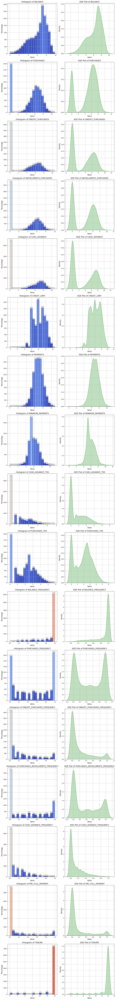

In [ ]:
import matplotlib.cm as cm

# List of columns for which you want to plot the distribution
columns_to_plot = log_scaled_data.drop(columns='CUST_ID').columns

# Set up the figure and axes for subplots
num_rows = len(columns_to_plot)
fig, axes = plt.subplots(num_rows, 2, figsize=(12, 6*num_rows))

# Flatten axes if necessary
if num_rows > 1:
    axes = axes.flatten()
else:
    axes = [axes]

# Define a colormap
color_map = cm.get_cmap('coolwarm')

# Plot histograms and KDE plots for each column
for i, col in enumerate(columns_to_plot):
    # Histogram
    total = len(log_scaled_data[col])
    sns.histplot(log_scaled_data[col], ax=axes[i*2], kde=False, color='blue', bins=20)
    axes[i*2].set_title(f'Histogram of {col}', fontsize=14)
    axes[i*2].set_xlabel('Value', fontsize=12)
    axes[i*2].set_ylabel('Percentage', fontsize=12)
    axes[i*2].grid(True)
    for j, rect in enumerate(axes[i*2].patches):
        height = rect.get_height()
        percentage = height/total
        color = color_map(percentage)
        rect.set_facecolor(color)
        axes[i*2].annotate(f'{percentage:.2%}', xy=(rect.get_x() + rect.get_width() / 2, height), xytext=(0, 3),
                           textcoords="offset points", ha='center', va='bottom', fontsize=6)  # Adjust font size here

    # KDE plot
    sns.kdeplot(log_scaled_data[col], ax=axes[i*2+1], color='green', shade=True)
    axes[i*2+1].set_title(f'KDE Plot of {col}', fontsize=14)
    axes[i*2+1].set_xlabel('Value', fontsize=12)
    axes[i*2+1].set_ylabel('Density', fontsize=12)
    axes[i*2+1].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()


# **5 - Clustring : --specifically finding best fit clusters number--**

## **Let's Draw inertia and silhouette_score and samples for :**

- log scaled data

- data as is

- standard scaled data

# **1- Log scaled data :**

In [ ]:
n_clusters=15
cost=[]
for i in range(1,n_clusters):
    kmean= KMeans(i, n_init=50)
    kmean.fit(log_scaled_data.drop(columns='CUST_ID'))
    cost.append(kmean.inertia_)

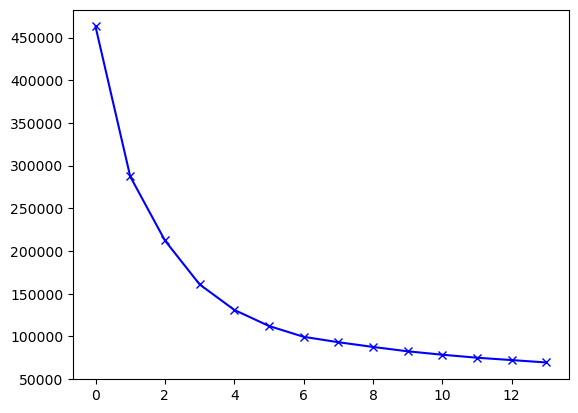

In [ ]:
plt.plot(cost, 'bx-')

## Elbow graph indicate that best fit clusters number is 5 cluster

In [ ]:
def calc_plot_silhouette(data_frame):
    fig, axs = plt.subplots(3, 3, figsize=(15, 15))
    for i in range(3, 12):
        kmeans = KMeans(n_clusters=i, n_init=50)
        kmeans.fit(data_frame.drop(columns='CUST_ID'))
        # Calculate the silhouette score
        silhouette_avg = silhouette_score(data_frame.drop(columns='CUST_ID'), kmeans.labels_)
        print("The average silhouette_score is :", silhouette_avg, f'for {i} means')
        sample_silhouette_values = silhouette_samples(data_frame.drop(columns='CUST_ID'), kmeans.labels_)

        # Subplot indices
        row = (i - 3) // 3
        col = (i - 3) % 3

        # Create a vertical bar plot for each sample
        y_lower = 10
        for j in range(i):
            # Aggregate the silhouette scores for samples belonging to cluster j, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[kmeans.labels_ == j]
            ith_cluster_silhouette_values.sort()

            # Compute the size of the ith cluster
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            # Plot the silhouette scores for samples in the ith cluster
            color = plt.cm.tab10(j / i)
            axs[row, col].fill_betweenx(np.arange(y_lower, y_upper),
                                        0, ith_cluster_silhouette_values,
                                        facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            axs[row, col].text(-0.05, y_lower + 0.5 * size_cluster_i, str(j))

            # Compute the new y_lower for the next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        # Add vertical line for average silhouette score
        axs[row, col].axvline(x=silhouette_avg, color="red", linestyle="--")

        # Labeling
        axs[row, col].set_title(f"Silhouette plot for {i} clusters")
        axs[row, col].set_xlabel("Silhouette coefficient values")
        axs[row, col].set_ylabel("Cluster label")

        # Add silhouette score to the subplot
        axs[row, col].text(0.5, 0.95, f'Silhouette Score: {silhouette_avg:.2f}',
                        horizontalalignment='center',
                        verticalalignment='top',
                        transform=axs[row, col].transAxes,
                        fontsize=10)

        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        axs[row, col].set_xlim([-0.1, 1])
        axs[row, col].set_ylim([0, len(data_frame.drop(columns='CUST_ID')) + (5 + 1) * 10])  # 5 is the number of clusters
        axs[row, col].set_yticks([])  # Clear the yaxis labels / ticks
        axs[row, col].set_xticks(np.arange(-0.1, 1.1, 0.1))  # Add ticks every 0.1
    plt.tight_layout()
    plt.show()


The average silhouette_score is : 0.370742821703333 for 3 means
The average silhouette_score is : 0.389627882073097 for 4 means
The average silhouette_score is : 0.41256336251656456 for 5 means
The average silhouette_score is : 0.42438139154086507 for 6 means
The average silhouette_score is : 0.44242965607316687 for 7 means
The average silhouette_score is : 0.3989920823542229 for 8 means
The average silhouette_score is : 0.3277096003954151 for 9 means
The average silhouette_score is : 0.29003539815273255 for 10 means
The average silhouette_score is : 0.2807460751678357 for 11 means


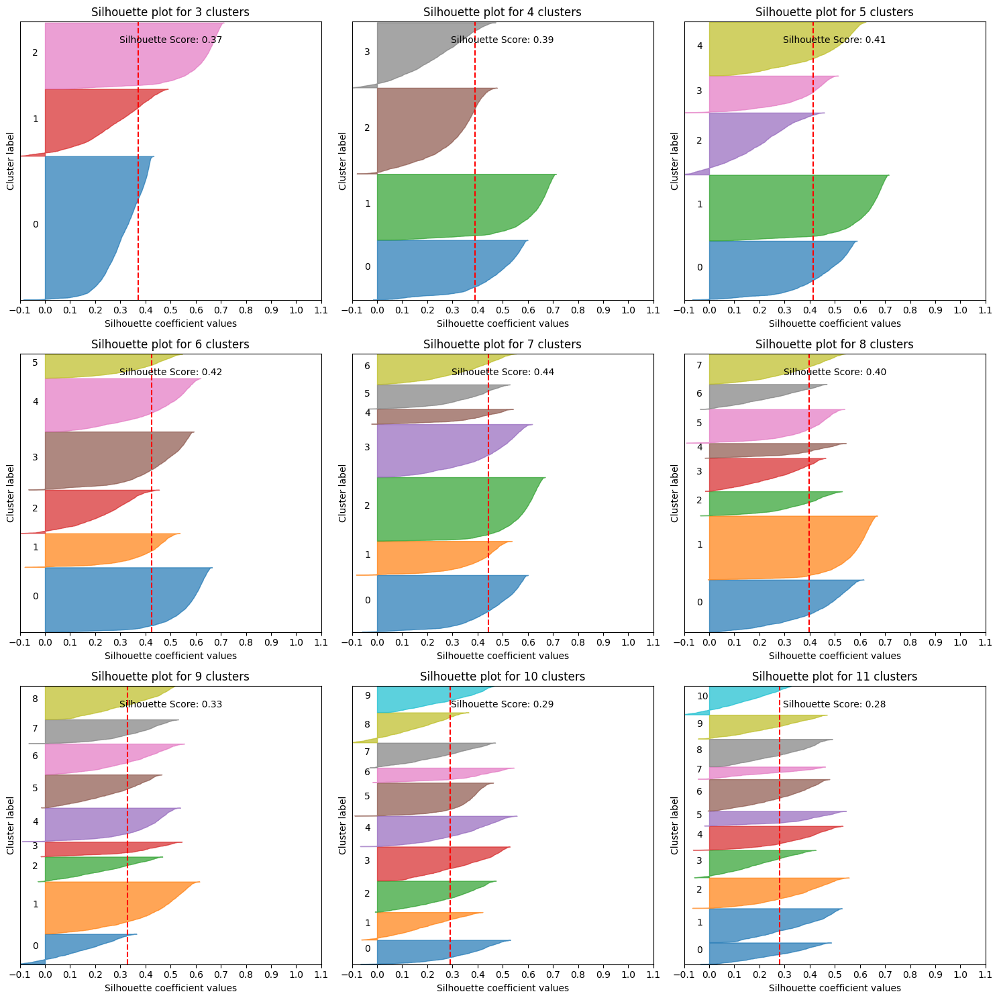

In [ ]:
calc_plot_silhouette(log_scaled_data)

## silhouette_score says that best fit clusters number is 7 clusters

## **Log-Scaled data shows that best Kmeans is (7) means === Highest silhouette_score and all clusters having nearly the same widht relatively**

### **Later will see why 7**

# **2- data as is :**

In [ ]:
n_clusters=15
cost=[]
for i in range(1,n_clusters):
    kmean= KMeans(i, n_init=50)
    kmean.fit(df.drop(columns='CUST_ID'))
    cost.append(kmean.inertia_)

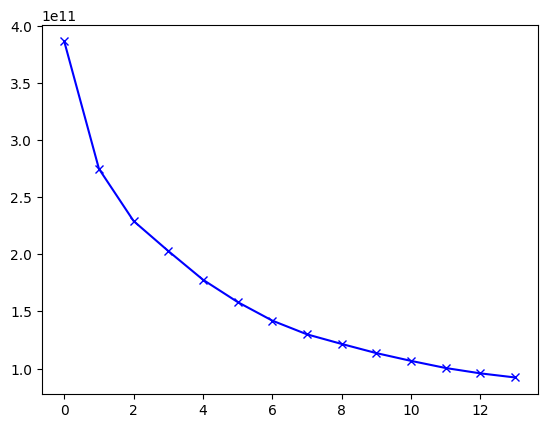

In [ ]:
plt.plot(cost, 'bx-')

The average silhouette_score is : 0.46475998818038666 for 3 means
The average silhouette_score is : 0.46195127234750694 for 4 means
The average silhouette_score is : 0.39510519878351313 for 5 means
The average silhouette_score is : 0.3721809005060866 for 6 means
The average silhouette_score is : 0.36929575463350706 for 7 means
The average silhouette_score is : 0.38323097416948376 for 8 means
The average silhouette_score is : 0.35204112144618804 for 9 means
The average silhouette_score is : 0.35903618407698884 for 10 means
The average silhouette_score is : 0.36474780514271543 for 11 means


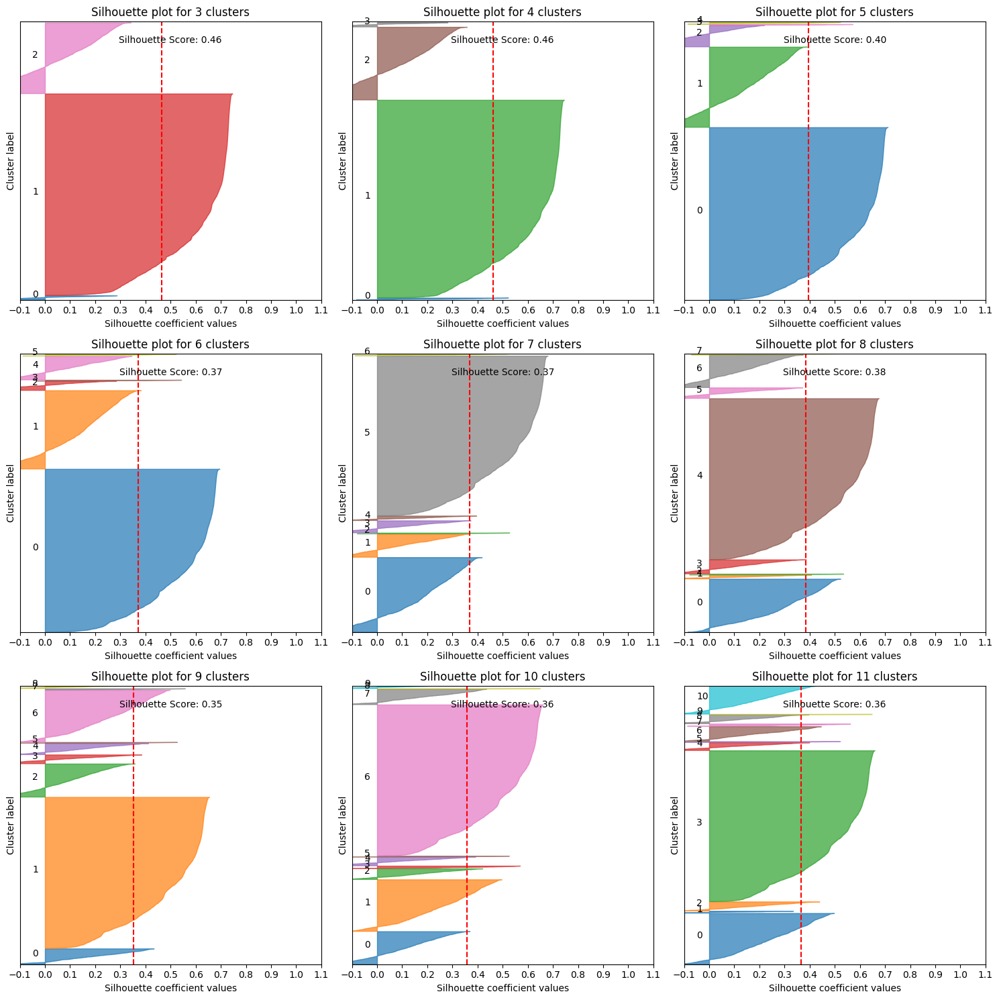

In [ ]:
calc_plot_silhouette(df)

## **Data as is shows distorted clusters , we can't get information about number of cluster**

# **3- Normalized data :**

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
normalized_data = scaler.fit_transform(df.drop(columns='CUST_ID'))
normalized_data = pd.DataFrame(normalized_data)
normalized_data['CUST_ID'] = df['CUST_ID']

In [ ]:
n_clusters=15
cost=[]
for i in range(1,n_clusters):
    kmean= KMeans(i, n_init=50)
    kmean.fit(normalized_data.drop(columns='CUST_ID'))
    cost.append(kmean.inertia_)

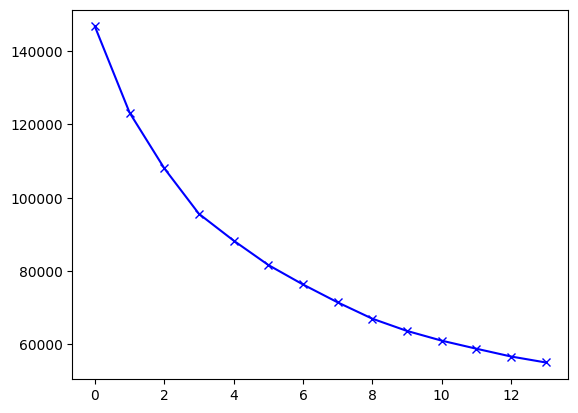

In [ ]:
plt.plot(cost, 'bx-')

The average silhouette_score is : 0.2467498144646943 for 3 means
The average silhouette_score is : 0.1969664387622151 for 4 means
The average silhouette_score is : 0.1920735662890929 for 5 means
The average silhouette_score is : 0.20701804740583507 for 6 means
The average silhouette_score is : 0.21984133293432187 for 7 means
The average silhouette_score is : 0.22726120317133666 for 8 means
The average silhouette_score is : 0.23095453558637863 for 9 means
The average silhouette_score is : 0.22592741517466225 for 10 means
The average silhouette_score is : 0.22080239872254914 for 11 means


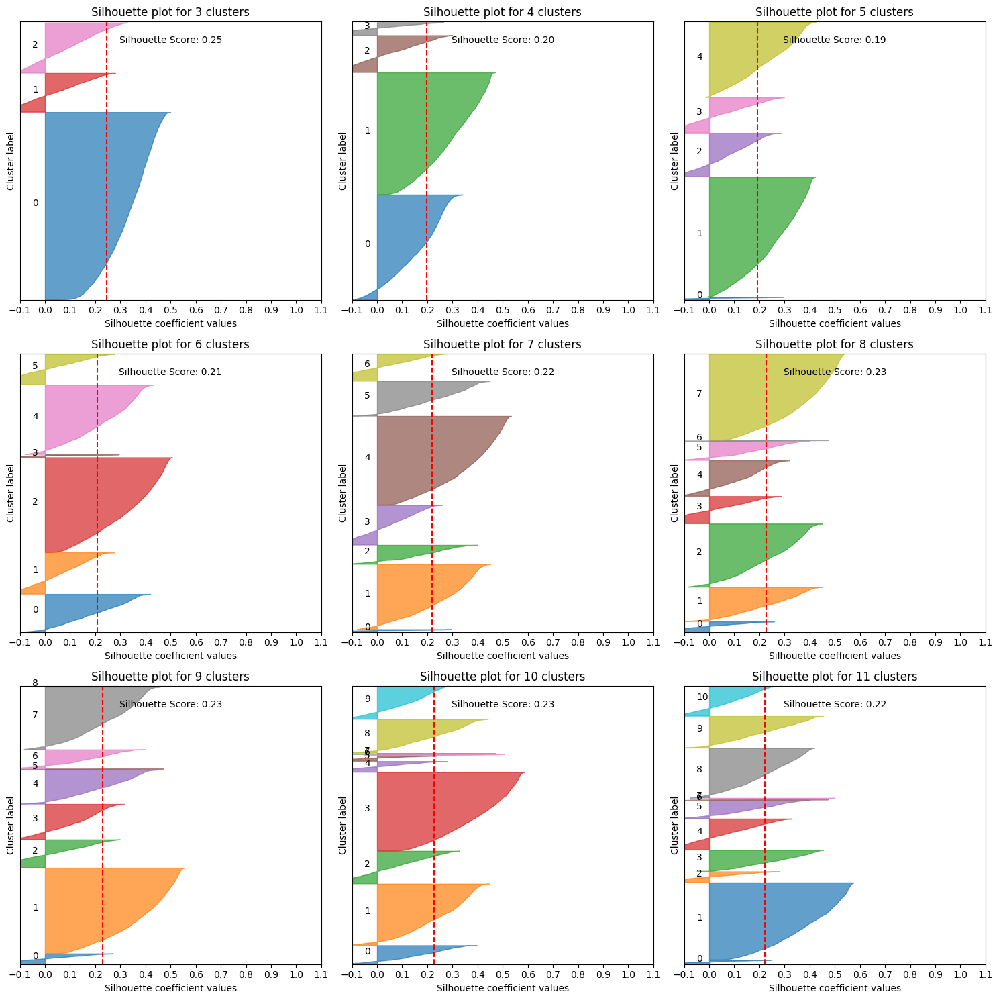

In [ ]:
calc_plot_silhouette(normalized_data)

## **Normalized data shows distorted clusters , we can't get information about number of cluster**

# **Applying Kmeans with K =** 7️ According to Log-scaled data Elbow, and silhouette score and graph

In [ ]:
kmeans = KMeans(n_clusters=7, n_init=50, max_iter=1000)
kmeans.fit(log_scaled_data.drop(columns='CUST_ID'))

KMeans(max_iter=1000, n_clusters=7, n_init=50)

In [ ]:
clusters = kmeans.labels_
len(clusters)

8628

In [ ]:
labeled_df = pd.concat([df.reset_index(drop=True), pd.DataFrame({'cluster': clusters})], axis=1)

In [ ]:
print(labeled_df.shape)
labeled_df.head()

(8628, 19)


,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.00,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.25,4,0,7000.0,4103.032597,1072.340217,0.222222,12,2
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.00,0,12,7500.0,622.066742,627.284787,0.000000,12,5
3,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.00,0,1,1200.0,678.334763,244.791237,0.000000,12,5
4,C10006,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.00,0,8,1800.0,1400.057770,2407.246035,0.000000,12,1


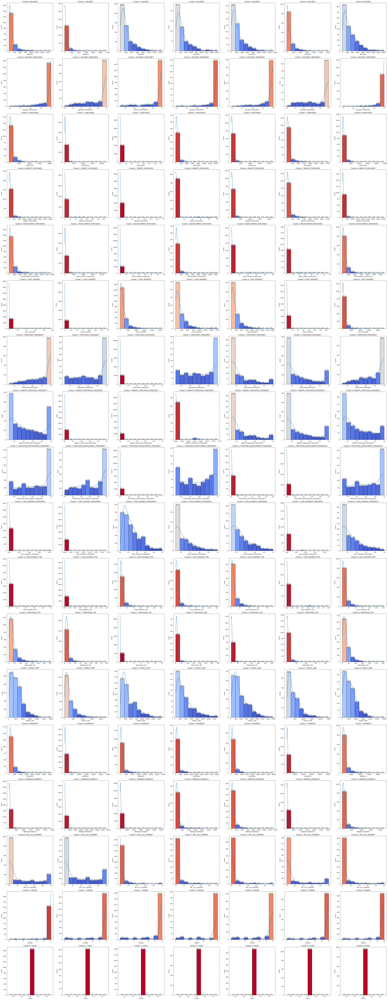

In [ ]:
# Determine the maximum cluster value
max_cluster = labeled_df['cluster'].max()

# Set the number of rows for the subplot grid
num_rows = max_cluster + 1

# Set the number of columns based on the number of columns in the DataFrame
num_columns = labeled_df.drop(columns='CUST_ID').shape[1]

# Create the subplot grid with transposed rows and columns
fig, axes = plt.subplots(nrows=num_columns, ncols=num_rows, figsize=(6*num_rows, 6*num_columns))

# Iterate over each cluster
for i in range(max_cluster + 1):
    # Filter the DataFrame for the current cluster
    filtered_df = labeled_df[labeled_df['cluster'] == i].drop(columns='CUST_ID')

    # Iterate over each column in the filtered DataFrame
    for j, col in enumerate(filtered_df.columns):
        # Plot histogram for the current column using Seaborn
        sns.histplot(filtered_df[col], ax=axes[j, i], kde=True, bins=10)  # Normalize the histogram

        # Calculate total bin height
        total_bin_height = sum(p.get_height() for p in axes[j, i].patches)

        # Define colormap
        cmap = plt.cm.coolwarm

        # Color the bins based on the percentage of bin height
        for p in axes[j, i].patches:
            percentage = p.get_height() / total_bin_height
            color = cmap(percentage)
            p.set_facecolor(color)

            # Annotate each bar with percentage of bin height
            x = p.get_x() + p.get_width() / 2
            y = p.get_height()
            axes[j, i].annotate('{:.1f}%'.format(100 * percentage), (x, y), ha='center', va='bottom', fontsize=10, color='black')

        # Set title for the subplot
        axes[j, i].set_title(f'Cluster {i}, {col}')

# Add a colorbar
norm = plt.Normalize(0, 1)
# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# Save the plot
fig.savefig('test.pdf')

## **6- Labeling Clusters : (Clients Segments)**

In [ ]:
colors = {0: 'red',
          1: 'blue',
          2: 'green',
          3: 'yellow',
          4: 'purple',
          5:'orange',
          6: 'black'}

names = {0: 'clients with Low cost purchases',
         1: 'clients who don\'t make installment purchases, with low Purchase frequency ',
         2: 'clients who don\'t make chas advance, with low balance and make some high oneoff purchases',
         3: 'clients who don\'t make any purchases, with low cost cash advance',
         4: 'clients who don\'t make oneoff purchases or cash advance, with low cost installment purchases, low credit limit',
         5:'clients make installment(high rate), one off(low rate) purchases, cash advance',
         6:'clients with Low balance, don\'t make installment purchases or cash advance'}

### **Using T-SNE to see how they could be separated ! :**

### 1. In 2-D plane

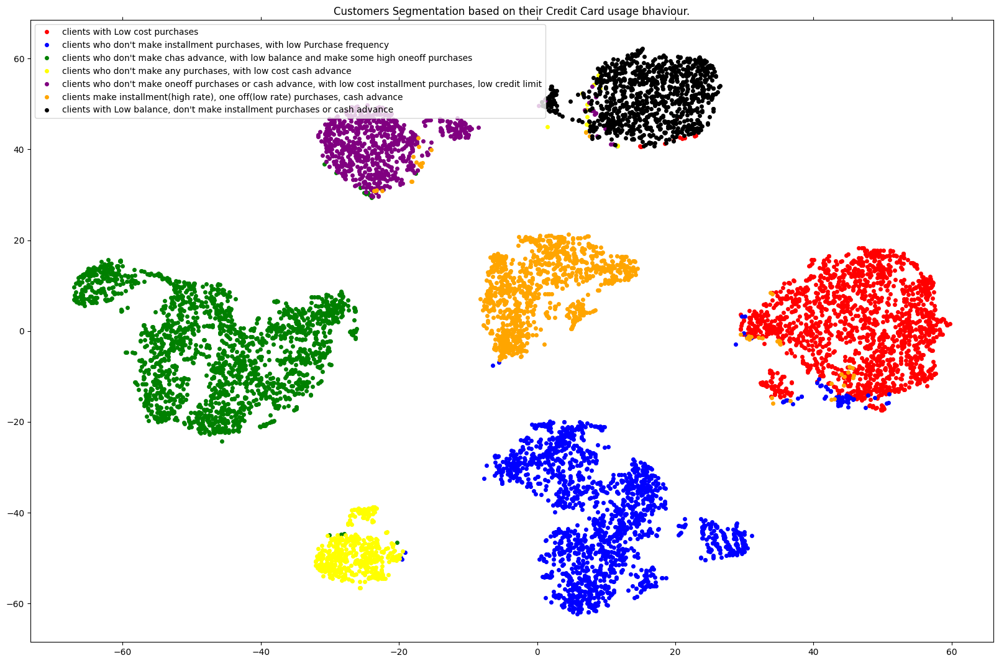

In [ ]:
%matplotlib inline
tsne_2 = TSNE(n_components=2, perplexity=75)
X_tsne_2 = tsne_2.fit_transform(log_scaled_data.drop(columns='CUST_ID'))
x, y = X_tsne_2[:, 0], X_tsne_2[:, 1]

df_new = pd.DataFrame({'x': x, 'y':y, 'label':clusters})
groups = df_new.groupby('label')

fig, ax = plt.subplots(figsize=(20, 13))

for name, group in groups:
    ax.plot(group.x, group.y, marker='o', linestyle='', ms=5,
            color=colors[name],label=names[name], mec='none')
    ax.set_aspect('auto')
    ax.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off')
    ax.tick_params(axis= 'y',which='both',left='off',top='off',labelleft='off')

ax.legend()
ax.set_title("Customers Segmentation based on their Credit Card usage bhaviour.")
plt.show()

In [ ]:
'''%matplotlib inline
tsne_2 = TSNE(n_components=2, perplexity=75)
X_tsne_2 = tsne_2.fit_transform(normalized_data.drop(columns='CUST_ID'))
x, y = X_tsne_2[:, 0], X_tsne_2[:, 1]

df_new = pd.DataFrame({'x': x, 'y':y, 'label':clusters})
groups = df_new.groupby('label')

fig, ax = plt.subplots(figsize=(20, 13))

for name, group in groups:
    ax.plot(group.x, group.y, marker='o', linestyle='', ms=5,
            color=colors[name],label=names[name], mec='none')
    ax.set_aspect('auto')
    ax.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off')
    ax.tick_params(axis= 'y',which='both',left='off',top='off',labelleft='off')

ax.legend()
ax.set_title("Customers Segmentation based on their Credit Card usage bhaviour.")
plt.show()

SyntaxError: incomplete input (<ipython-input-65-bae51aa6adf6>, line 1)

### 2. In 3-D plane

In [ ]:
# Reduce dimensionality using t-SNE
tsne = TSNE(n_components=3, perplexity=75)
X_tsne = tsne.fit_transform(log_scaled_data.drop(columns='CUST_ID'))

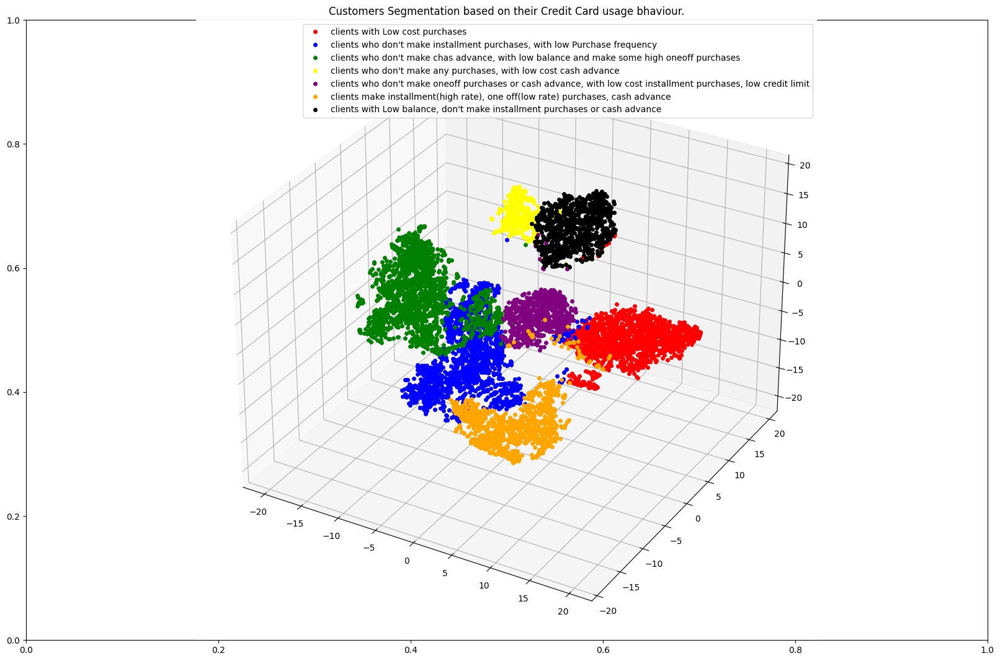

In [ ]:
!pip install PyQt5
!pip install matplotlib
import matplotlib # imports the matplotlib module
# Switch the backend to 'Qt5Agg'
# This needs to be done before creating any figures
matplotlib.use('Qt5Agg') # uses the matplotlib module to set the backend

import matplotlib.pyplot as plt # imports the matplotlib module and renames it to plt


x, y, z = X_tsne[:, 0], X_tsne[:, 1], X_tsne[:, 2]

df_new = pd.DataFrame({'x': x, 'y':y, 'z':z, 'label':clusters})
groups = df_new.groupby('label')

fig, ax = plt.subplots(figsize=(20, 13))
ax = fig.add_subplot(projection='3d')

for name, group in groups:
    ax.plot(group.x, group.y, group.z, marker='o', linestyle='', ms=5,
            color=colors[name],label=names[name], mec='none')
    ax.set_aspect('auto')
    ax.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off')
    ax.tick_params(axis= 'y',which='both',left='off',top='off',labelleft='off')

ax.legend()
ax.set_title("Customers Segmentation based on their Credit Card usage bhaviour.")
plt.show()

In [ ]:
'''
%matplotlib qt5

x, y, z = X_tsne[:, 0], X_tsne[:, 1], X_tsne[:, 2]

df_new = pd.DataFrame({'x': x, 'y':y, 'z':z, 'label':clusters})
groups = df_new.groupby('label')

fig, ax = plt.subplots(figsize=(20, 13))
ax = fig.add_subplot(projection='3d')

for name, group in groups:
    ax.plot(group.x, group.y, group.z, marker='o', linestyle='', ms=5,
            color=colors[name],label=names[name], mec='none')
    ax.set_aspect('auto')
    ax.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off')
    ax.tick_params(axis= 'y',which='both',left='off',top='off',labelleft='off')

ax.legend()
ax.set_title("Customers Segmentation based on their Credit Card usage bhaviour.")
plt.show()

SyntaxError: incomplete input (<ipython-input-58-b1bcf8e01d8a>, line 1)

### **Using PCA to Draw clusters in 3-D plane:**

In [ ]:
# Reduce dimensionality using PCA
pca = PCA(n_components=3)
X_pca = pca.fit_transform(log_scaled_data.drop(columns='CUST_ID'))
np.cumsum(pca.explained_variance_ratio_)

array([0.48689192, 0.71775536, 0.8586883 ])

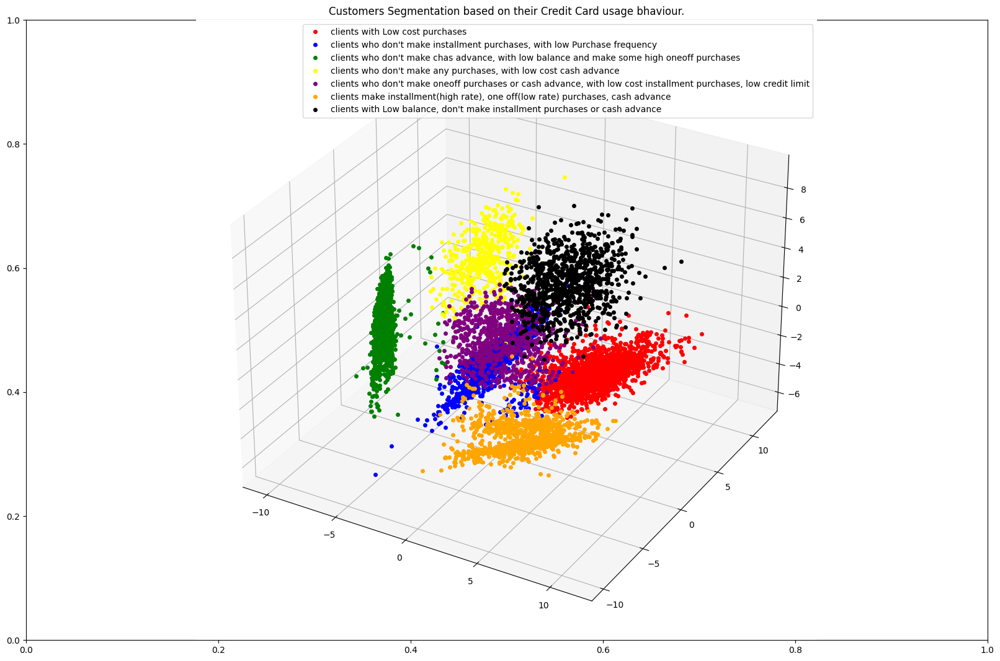

In [ ]:
# %matplotlib qt
%matplotlib inline
x, y, z = X_pca[:, 0], X_pca[:, 1], X_pca[:, 2]

new_df = pd.DataFrame({'x': x, 'y':y, 'z':z,'label':clusters})
groups = new_df.groupby('label')

fig, ax = plt.subplots(figsize=(20, 13))
ax = fig.add_subplot(projection='3d')
for name, group in groups:
    ax.plot(group.x, group.y, group.z, marker='o', linestyle='', ms=5,
            color=colors[name],label=names[name], mec='none')
    ax.set_aspect('auto')
    ax.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off')
    ax.tick_params(axis= 'y',which='both',left='off',top='off',labelleft='off')

ax.legend()
ax.set_title("Customers Segmentation based on their Credit Card usage bhaviour.")
plt.show()

# **7- What about hierircal clustering ?**

## **Plotting dendrogram for each :**

- ## Log scaled data

- ## Normalized data

- ## Raw data

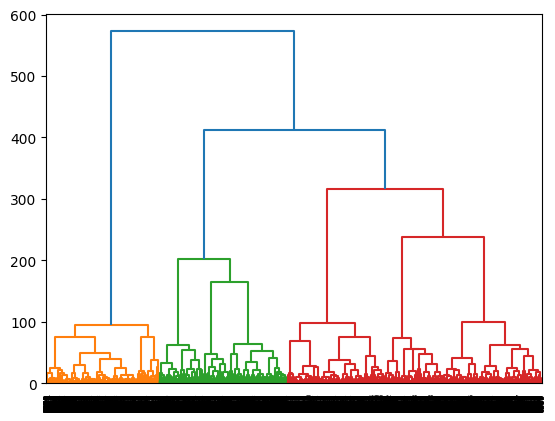

In [ ]:
link_mat = ward(log_scaled_data.drop(columns='CUST_ID'))
dendrogram(link_mat)
plt.show()

### It shows that 7 clusters might be the best choice in this case 7️⃣

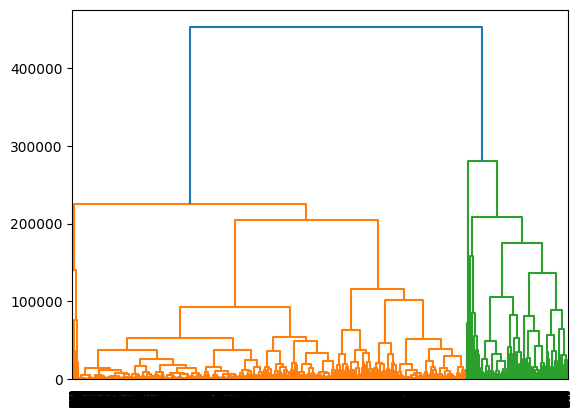

In [ ]:
link_mat = ward(df.drop(columns='CUST_ID'))
dendrogram(link_mat)
plt.show()

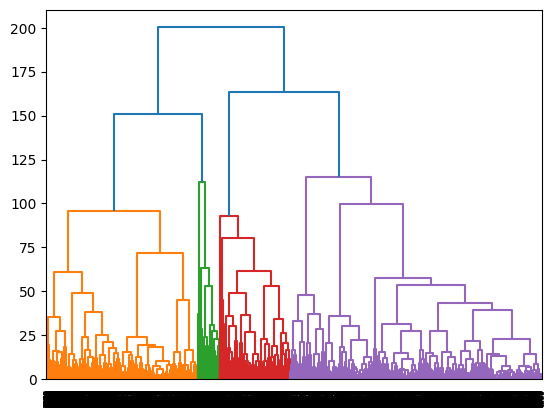

In [ ]:
link_mat = ward(normalized_data.drop(columns='CUST_ID'))
dendrogram(link_mat)
plt.show()

In [ ]:
'''link_mat = ward(normalized_data)
dendrogram(link_mat)
plt.show()


SyntaxError: incomplete input (<ipython-input-72-5593b50cdf9f>, line 1)

## 8 - Applying DBSCAN Clustring algorithms :

### 3-D plot :

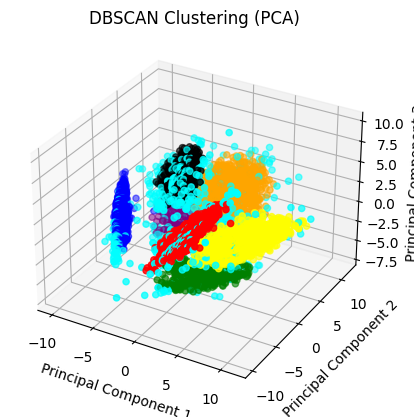

In [ ]:
# %matplotlib qt
# %matplotlib inline

X = log_scaled_data.drop(columns='CUST_ID')

# Applying PCA for dimensionality reduction
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X)

# Applying DBSCAN
dbscan = DBSCAN(eps=2.7, min_samples=120)
y_dbscan = dbscan.fit_predict(X)

# Creating a custom colormap with high contrast
# Cyan |====>> -1, noise
colors = ['cyan', 'red', 'blue', 'green', 'yellow', 'purple', 'orange', 'black']

cmap = ListedColormap(colors)

# Plotting the results
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=y_dbscan, cmap=cmap)
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.set_zlabel("Principal Component 3")
ax.set_title("DBSCAN Clustering (PCA)")
plt.show()


### 2-D plot

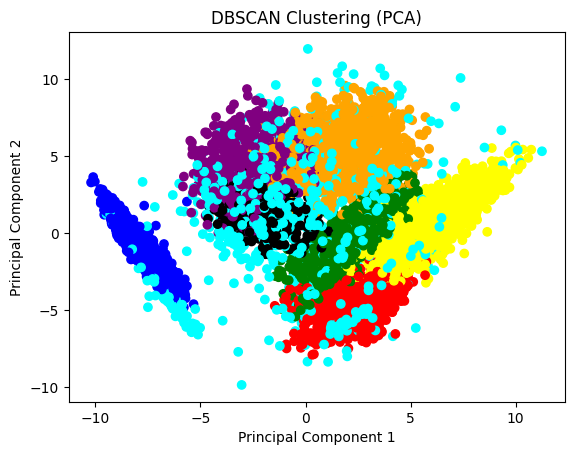

In [ ]:
%matplotlib inline

X = log_scaled_data.drop(columns='CUST_ID')

# Applying PCA for dimensionality reduction
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Applying DBSCAN
dbscan = DBSCAN(eps=2.7, min_samples=120)
y_dbscan = dbscan.fit_predict(X)

# Creating a custom colormap with high contrast
# Cyan |====>> -1, noise
colors = ['cyan', 'red', 'blue', 'green', 'yellow', 'purple', 'orange', 'black']

cmap = ListedColormap(colors)

# Plotting the results
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(X_pca[:, 0], X_pca[:, 1], c=y_dbscan, cmap=cmap)
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.set_title("DBSCAN Clustering (PCA)")
plt.show()


In [ ]:
# Noisey points
(y_dbscan==-1).sum()

814

In [ ]:
# Determine the maximum cluster value
clusters = y_dbscan
labeled_df_DBSCAN = pd.concat([df.reset_index(drop=True), pd.DataFrame({'cluster': clusters})], axis=1)
max_cluster = labeled_df_DBSCAN['cluster'].max()

# Set the number of rows for the subplot grid
num_rows = max_cluster + 2

# Set the number of columns based on the number of columns in the DataFrame
num_columns = labeled_df_DBSCAN.drop(columns='CUST_ID').shape[1]

# Create the subplot grid with transposed rows and columns
fig, axes = plt.subplots(nrows=num_columns, ncols=num_rows, figsize=(7*num_rows, 7*num_columns))

# Iterate over each cluster
for i in range(max_cluster+2):
    # Filter the DataFrame for the current cluster
    filtered_df = labeled_df_DBSCAN[labeled_df_DBSCAN['cluster'] == i-1].drop(columns='CUST_ID')

    # Iterate over each column in the filtered DataFrame
    for j, col in enumerate(filtered_df.columns):
        # Plot histogram for the current column using Seaborn
        sns.histplot(filtered_df[col], ax=axes[j, i], kde=True, bins=10)  # Normalize the histogram

        # Calculate total bin height
        total_bin_height = sum(p.get_height() for p in axes[j, i].patches)

        # Define colormap
        cmap = plt.cm.coolwarm

        # Color the bins based on the percentage of bin height
        for p in axes[j, i].patches:
            percentage = p.get_height() / total_bin_height
            color = cmap(percentage)
            p.set_facecolor(color)

            # Annotate each bar with percentage of bin height
            x = p.get_x() + p.get_width() / 2
            y = p.get_height()
            axes[j, i].annotate('{:.1f}%'.format(100 * percentage), (x, y), ha='center', va='bottom', fontsize=10, color='black')

        # Set title for the subplot
        axes[j, i].set_title(f'Cluster {i-1}, {col}')

# Add a colorbar
norm = plt.Normalize(0, 1)
# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# Save the plot
fig.savefig('clusters_DBSCAN.pdf')

In [ ]:
def plot_clusters_hist(clusters):
    # Assuming clusters is your list/array of cluster labels
    clusters = np.array(clusters)

    # Count the frequency of each unique cluster
    unique_clusters, cluster_counts = np.unique(clusters, return_counts=True)

    # Sort based on frequency
    sorted_indices = np.argsort(cluster_counts)[::-1]  # Sort in descending order
    sorted_clusters = unique_clusters[sorted_indices]
    sorted_counts = cluster_counts[sorted_indices]

    # Plot the histogram with sorted bars
    plt.bar(range(len(sorted_clusters)), sorted_counts)
    plt.xlabel('Cluster')
    plt.ylabel('Frequency')
    plt.title('Histogram of Clusters (Sorted by Frequency)')
    plt.xticks(range(len(sorted_clusters)), sorted_clusters)  # Set xticks as sorted clusters
    plt.grid(True)
    plt.show()



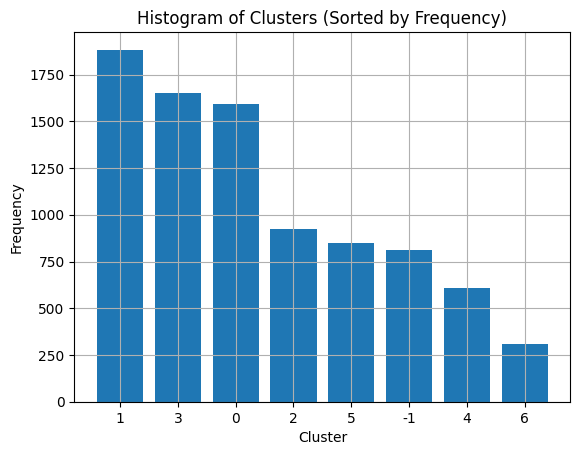

In [ ]:
plot_clusters_hist(y_dbscan)

### The graph above represent number of clients in each cluster due to DBSCAN Clustring, knowing that -1 bar is noise, which means it does not belong or represent any cluster

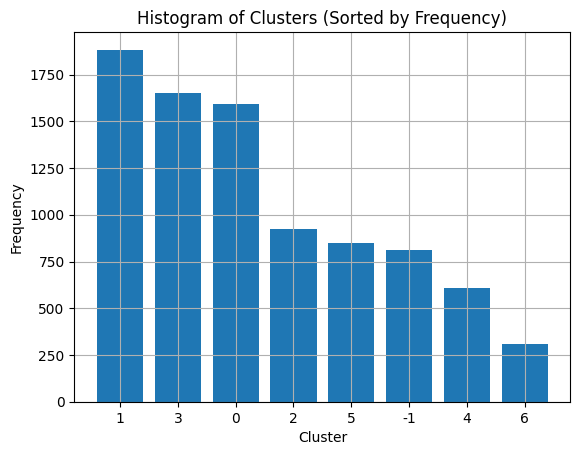

In [ ]:
plot_clusters_hist(clusters)

### The graph above represent number of clients in each cluster due to KMeans Clustring

In [ ]:
y_dbscan[y_dbscan == -1].sum()

-814

## only ***814*** Noise == ***9.5%*** of the data, which is almost acceptable

# Dropping [-1] bar from DBSCAN, we notice that there is a similarity somehow between number of clients in each cluster, numbers are consistent

## And Also by comparing the distributions all clusters resulted by Kmeans, and DBSCAN, each cluster in each algorithm have almost the same distribution ***(taking in consideration numbering differences between two algorithms)*** which assure cosistency of clustring and showing **7 clusters** is the most accurate number of groups in this case.

## 9- **Applying GMM :**

When using the Gaussian Mixture Model (GMM) algorithm in scikit-learn (sklearn), there are several parameters you can tune to customize the behavior of the model. Here are some important parameters:

## n_components:

Specifies the number of Gaussian components in the mixture. This parameter defines the number of clusters the algorithm will attempt to identify.

## covariance_type:

Determines the type of covariance parameters to use. It controls the shape of the clusters.

Possible options are:

"full": Each component has its own general covariance matrix.

"tied": All components share the same general covariance matrix.

"diag": Each component has its own diagonal covariance matrix.

"spherical": Each component has its own single variance.

tol:


The convergence threshold. EM iterations will stop when the lower bound average gain is below this threshold.

## max_iter:

The maximum number of iterations for the EM algorithm.

## init_params:

Determines the method for initializing the model parameters.

Possible options are:

"kmeans": Use KMeans to initialize the means and the full covariance matrices.

"random": Initialize randomly.

A user-provided initialization.

weights_init, means_init, precisions_init:

Initial parameters for weights, means, and precisions (inverse of covariance matrices) if provided. These parameters can be used for manual initialization.

## n_init:

The number of initializations to perform. The final result will be the best output of n_init consecutive runs in terms of the lower bound value.

In [ ]:
from sklearn.mixture import GaussianMixture
default_parameters = {
    "n_components": 7,
    "covariance_type": "full",
    "tol": 0.001,
    "reg_covar": 1e-06,
    "max_iter": 100,
    "n_init": 1,
    "init_params": "kmeans",
    "weights_init": None,
    "means_init": None,
    "precisions_init": None,
    "random_state": None,
    "warm_start": False,
    "verbose": 0,
    "verbose_interval": 10
}

# Create GMM object with all default parameters
gmm = GaussianMixture(**default_parameters)
gmm.fit(log_scaled_data.drop(columns='CUST_ID'))
labels = gmm.predict(log_scaled_data.drop(columns='CUST_ID'))

In [ ]:
labeled_df_gmm = pd.concat([df.reset_index(drop=True), pd.DataFrame({'cluster': labels})], axis=1)

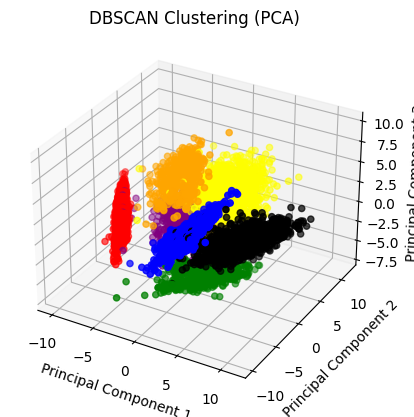

In [ ]:
# %matplotlib qt
%matplotlib inline

X = log_scaled_data.drop(columns='CUST_ID')

# Applying PCA for dimensionality reduction
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X)

# Creating a custom colormap with high contrast
colors = ['red', 'blue', 'green', 'yellow', 'purple', 'orange', 'black']

cmap = ListedColormap(colors)

# Plotting the results
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=labels, cmap=cmap)
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.set_zlabel("Principal Component 3")
ax.set_title("DBSCAN Clustering (PCA)")
plt.show()


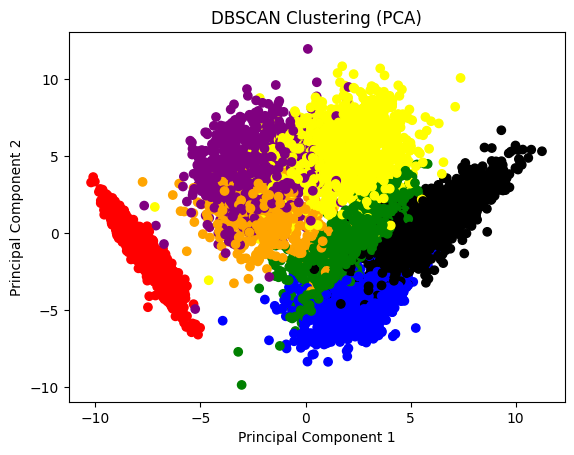

In [ ]:
%matplotlib inline

X = log_scaled_data.drop(columns='CUST_ID')

# Applying PCA for dimensionality reduction
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)


# Creating a custom colormap with high contrast
colors = ['red', 'blue', 'green', 'yellow', 'purple', 'orange', 'black']

cmap = ListedColormap(colors)

# Plotting the results
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap=cmap)
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.set_title("DBSCAN Clustering (PCA)")
plt.show()


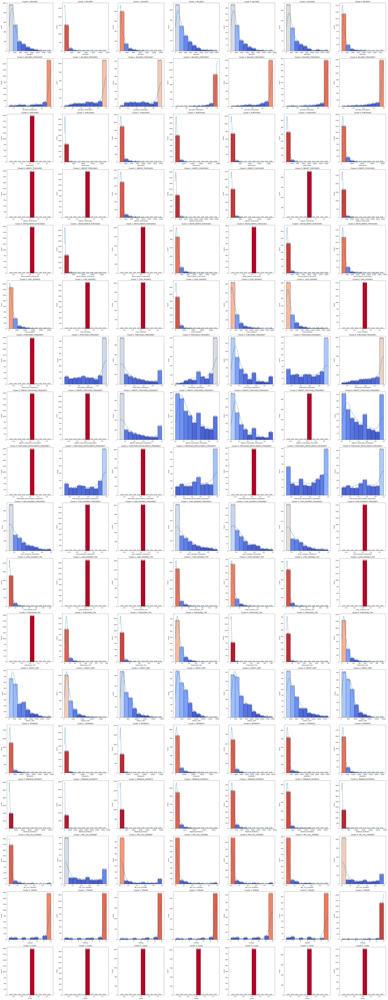

In [ ]:
# Determine the maximum cluster value
max_cluster = labeled_df_gmm['cluster'].max()

# Set the number of rows for the subplot grid
num_rows = max_cluster + 1

# Set the number of columns based on the number of columns in the DataFrame
num_columns = labeled_df_gmm.drop(columns='CUST_ID').shape[1]

# Create the subplot grid with transposed rows and columns
fig, axes = plt.subplots(nrows=num_columns, ncols=num_rows, figsize=(6*num_rows, 6*num_columns))

# Iterate over each cluster
for i in range(max_cluster + 1):
    # Filter the DataFrame for the current cluster
    filtered_df = labeled_df_gmm[labeled_df_gmm['cluster'] == i].drop(columns='CUST_ID')

    # Iterate over each column in the filtered DataFrame
    for j, col in enumerate(filtered_df.columns):
        # Plot histogram for the current column using Seaborn
        sns.histplot(filtered_df[col], ax=axes[j, i], kde=True, bins=10)  # Normalize the histogram

        # Calculate total bin height
        total_bin_height = sum(p.get_height() for p in axes[j, i].patches)

        # Define colormap
        cmap = plt.cm.coolwarm

        # Color the bins based on the percentage of bin height
        for p in axes[j, i].patches:
            percentage = p.get_height() / total_bin_height
            color = cmap(percentage)
            p.set_facecolor(color)

            # Annotate each bar with percentage of bin height
            x = p.get_x() + p.get_width() / 2
            y = p.get_height()
            axes[j, i].annotate('{:.1f}%'.format(100 * percentage), (x, y), ha='center', va='bottom', fontsize=10, color='black')

        # Set title for the subplot
        axes[j, i].set_title(f'Cluster {i}, {col}')

# Add a colorbar
norm = plt.Normalize(0, 1)
# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# Save the plot
fig.savefig('clusters_gmm.pdf')

## **GMM Also Assure that clustring criteria is best-fit**

## Same clusters (2D and 3D) and same distribution of each cluster for all clustering Algorithms